<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Real-estate-rental-hedonic-model-workflow" data-toc-modified-id="Real-estate-rental-hedonic-model-workflow-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Real estate rental hedonic model workflow</a></span></li><li><span><a href="#Estimate-a-rental-hedonic-model" data-toc-modified-id="Estimate-a-rental-hedonic-model-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Estimate a rental hedonic model</a></span><ul class="toc-item"><li><span><a href="#Specify-parameters-and-pass-them-to-a-model-object" data-toc-modified-id="Specify-parameters-and-pass-them-to-a-model-object-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Specify parameters and pass them to a model object</a></span></li><li><span><a href="#Estimate-the-model" data-toc-modified-id="Estimate-the-model-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Estimate the model</a></span></li><li><span><a href="#Register-(save)-the-model" data-toc-modified-id="Register-(save)-the-model-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Register (save) the model</a></span></li></ul></li><li><span><a href="#Run-the-model-(generate-predictions-from-it)" data-toc-modified-id="Run-the-model-(generate-predictions-from-it)-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Run the model (generate predictions from it)</a></span><ul class="toc-item"><li><span><a href="#Compute-residuals-and-examine-them" data-toc-modified-id="Compute-residuals-and-examine-them-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Compute residuals and examine them</a></span></li></ul></li><li><span><a href="#Generate-maps-to-evaluate-model" data-toc-modified-id="Generate-maps-to-evaluate-model-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Generate maps to evaluate model</a></span><ul class="toc-item"><li><span><a href="#Map-observed,-predicted-and-residual-values-using-Datashader" data-toc-modified-id="Map-observed,-predicted-and-residual-values-using-Datashader-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Map observed, predicted and residual values using Datashader</a></span></li><li><span><a href="#Map-observed,-predicted-and-residuals-using-Datashader-with-interactive-maps" data-toc-modified-id="Map-observed,-predicted-and-residuals-using-Datashader-with-interactive-maps-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Map observed, predicted and residuals using Datashader with interactive maps</a></span></li><li><span><a href="#Split-the-data-into-training-and-testing-datasets-for-cross-validation" data-toc-modified-id="Split-the-data-into-training-and-testing-datasets-for-cross-validation-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Split the data into training and testing datasets for cross-validation</a></span></li></ul></li></ul></div>

# Real estate rental hedonic model workflow

Paul Waddell, Arezoo Besharati, UrbanSim July 2018

Python 3.6, intended to be backward compatible with 2.7

Below we begin with all the imports, including datasources, which contains the references to all the input data to be used, and models, which contains code for network initialization and aggregations.

In [1]:
from __future__ import print_function
import warnings;warnings.simplefilter('ignore')
# Standard to run UrbanSim from the root level of the project directory
import os; os.chdir('../..')
import numpy as np
import pandas as pd
from urbansim_templates import modelmanager as mm
from urbansim_templates.models import OLSRegressionStep
import orca
# Load any script-based Orca registrations
from scripts import datasources
from scripts import models
%load_ext autoreload
%autoreload 2
from scipy.stats import norm
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import datashader as ds
import holoviews as hv
import geoviews as gv

# Estimate a rental hedonic model

The basic idea of the parcel template is that we create model steps by _passing arguments to classes_ rather than by writing Python functions and giving them Orca decorators, as we would for a fully custom model.

Much of the functionality for this is already built into UrbanSim and Orca, we'll just need to extend things here and there.

This demo uses a new RegressionStep() class that provides a full model development workflow: estimating a model, registering it with Orca, saving it for future use.

## Specify parameters and pass them to a model object

In [2]:
mm.initialize()

Loading model step 'hedonic_price_sqft_multi_family'
Loading model step 'hedonic_price_sqft_single_family'
Loading model step 'hedonic_rent_sqft'
Loading model step 'hlcm_constrained_sf'


In [3]:
rentals = orca.get_table('rentals').to_frame()
rentals['pred_rent_sqft'] = 0.0
rentals['res_sqft_per_unit'] = rentals['sqft']
orca.add_table('rentals', rentals)

## Estimate the model

In [4]:
m = OLSRegressionStep()
m.tables = ['rentals', 'nodessmall', 'nodeswalk']
m.filters = ['rent_sqft < 10']
m.model_expression = 'np.log1p(rent_sqft) ~ + np.log(res_sqft_per_unit) + \
    np.log(units_500_walk+1) + np.log(sqft_unit_500_walk+2)  + \
    np.log(rich_500_walk + 1) + np.log(singles_500_walk + 1) + np.log(elderly_hh_500_walk + 1) + \
    np.log(children_500_walk + 1) + \
    np.log(jobs_500_walk + 1) + np.log(jobs_1500_walk+1) + np.log(jobs_10000+1) + np.log(jobs_25000 + 1) + \
    np.log(pop_10000+1) + np.log(pop_black_10000+1) + np.log(pop_hisp_10000+1) + \
    np.log(pop_asian_10000+1)  '
m.out_column = 'pred_rent_sqft'
m.out_transform = np.expm1
m.name = 'hedonic_rent_sqft'
m.tags = ['paul', 'version 1']

m.fit()

                             OLS Regression Results                            
Dep. Variable:     np.log1p(rent_sqft)   R-squared:                       0.630
Model:                             OLS   Adj. R-squared:                  0.630
Method:                  Least Squares   F-statistic:                 4.126e+04
Date:                 Wed, 01 Aug 2018   Prob (F-statistic):               0.00
Time:                         10:22:21   Log-Likelihood:             1.6976e+05
No. Observations:               362901   AIC:                        -3.395e+05
Df Residuals:                   362885   BIC:                        -3.393e+05
Df Model:                           15                                         
Covariance Type:             nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------


## Register (save) the model

In [5]:
m.register()

Saving 'hedonic_rent_sqft.yaml': /Users/arezoobzadeh/Documents/GitHub/urbansim_parcel_bayarea/configs
Loading model step 'hedonic_rent_sqft'


# Run the model (generate predictions from it)

In [6]:
orca.run(['hedonic_rent_sqft'])

INFO:orca.orca:start: run step 'hedonic_rent_sqft'


Running step 'hedonic_rent_sqft'


INFO:orca.orca:finish: run step 'hedonic_rent_sqft'


Time to execute step 'hedonic_rent_sqft': 0.99 s
Total time to execute iteration 1 with iteration value None: 1.00 s


## Compute residuals and examine them

In [7]:
rentals['residuals_rent_sqft'] = rentals.pred_rent_sqft - rentals.rent_sqft

In [8]:
rentals[['rent_sqft','pred_rent_sqft','residuals_rent_sqft']].describe()

,rent_sqft,pred_rent_sqft,residuals_rent_sqft
count,363055.000000,363055.000000,363055.000000
mean,3.177249,3.125075,-0.052174
std,1.089517,0.805741,0.665769
min,0.283500,0.024381,-14.533181
25%,2.493750,2.597586,-0.352495
50%,2.998120,3.090075,0.029278
75%,3.675385,3.599736,0.335702
max,19.609375,7.477780,3.199954


In [9]:
# from scipy.stats import norm
# plt.rcParams['figure.figsize']=8,8
# #plot(residuals.mean(),0, residuals.mean(), 2.25)
# sns.set_style("white")
# sns.set_style("ticks")
# ax = sns.distplot(rentals.residuals_rent_sqft, bins=100, fit=norm, kde=False).set(xlim=(-5,5))

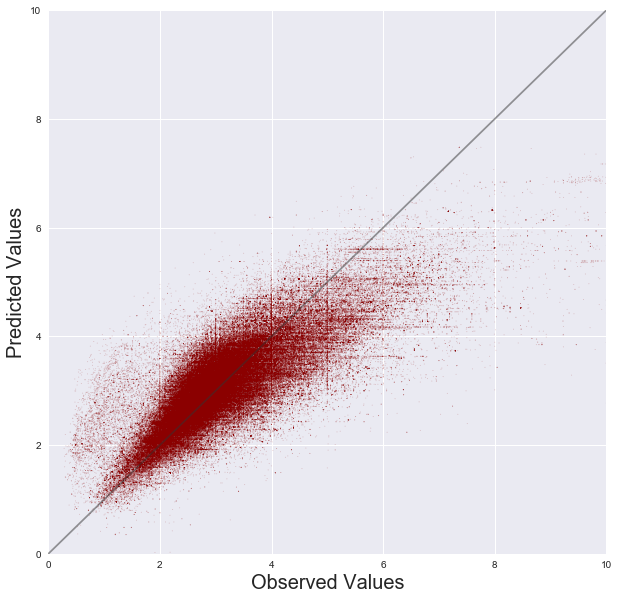

In [11]:
% matplotlib inline

f, ax = plt.subplots(1, figsize=(10, 10))
#plt.title("Predicted vs Observed Rent per Sqft", size = 20,alpha=1)

ax.scatter(y = rentals.pred_rent_sqft, x = rentals.rent_sqft,alpha=0.2,s=1,edgecolors='none',color='darkred')
plt.xlabel("Observed Values",size = 20)
plt.ylabel("Predicted Values",size = 20)

ax.set(xlim=(0, 10), ylim=(0, 10))

ax.grid(True)
ax.plot(ax.get_xlim(), ax.get_ylim(), c=".2",alpha=0.5)

plt.savefig('figures/pred_obs_scatter_OLS_2.png', format='png', dpi=300)
plt.show()

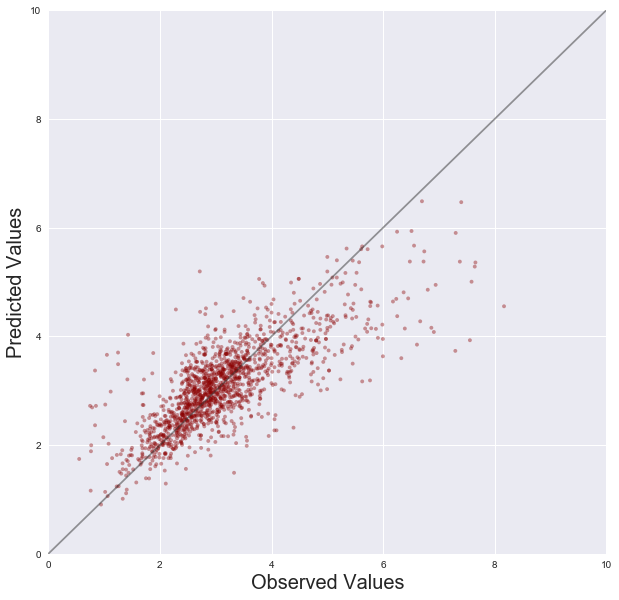

In [12]:
% matplotlib inline
rentals2= rentals.sample(1500,random_state=42)

f, ax = plt.subplots(1, figsize=(10, 10))
#plt.title("Predicted vs Observed Rent per Sqft", size = 20,alpha=1)

ax.scatter(y = rentals2.pred_rent_sqft, x = rentals2.rent_sqft,alpha=0.4,s=15,edgecolors='none',color='darkred')
plt.xlabel("Observed Values",size = 20)
plt.ylabel("Predicted Values",size = 20)



ax.set(xlim=(0, 10), ylim=(0, 10))

ax.grid(True)
ax.plot(ax.get_xlim(), ax.get_ylim(), c=".2",alpha=0.5)

plt.savefig('figures/pred_obs_scatter_OLS_sample.png', format='png', dpi=300)
plt.show()

In [13]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from math import sqrt
# The mean squared error
meanSquaredError = mean_squared_error(rentals.rent_sqft, rentals.pred_rent_sqft)
print('Mean squared error = %.2f' %meanSquaredError)

# rmse
rootMeanSquaredError = sqrt(meanSquaredError)
print('RMSE = %.2f' %rootMeanSquaredError)

# Explained variance score: 1 is perfect prediction
print('R2_score = %.2f' % r2_score(rentals.rent_sqft, rentals.pred_rent_sqft))

Mean squared error = 0.45
RMSE = 0.67
R2_score = 0.62


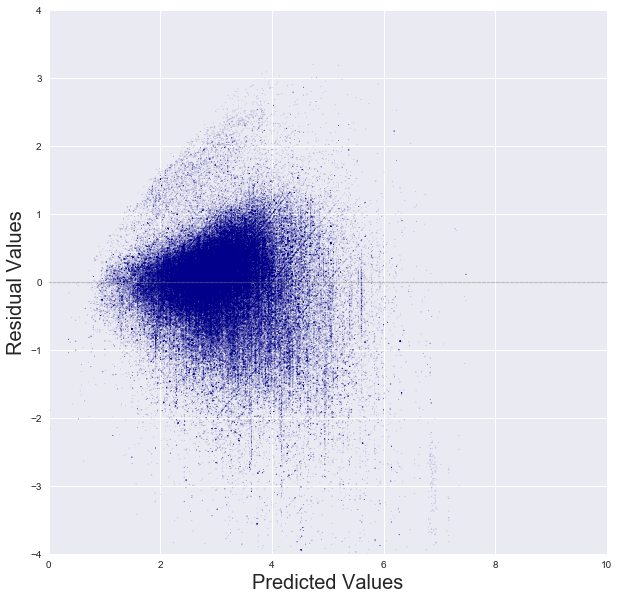

In [14]:

% matplotlib inline

f, ax = plt.subplots(1, figsize=(10, 10))
#plt.title("Residuals vs Predicted Values for OLS model", size = 20,alpha=1)

ax = plt.scatter(y = rentals.residuals_rent_sqft, x = rentals.pred_rent_sqft,alpha=0.2,s=1,
                 edgecolors='none',color='darkblue')
plt.xlabel("Predicted Values",size = 20)
plt.ylabel("Residual Values",size = 20)


x1 = np.linspace(0, 10, 1000)
y1 = np.zeros(len(x1))
plt.scatter(x1,y1,alpha=0.2,color='gray',s=1 )

plt.xlim(0, 10)
plt.ylim(-4,4)
plt.savefig('figures/residuals_prediction_OLS_full.png', format='png', dpi=300)
plt.show()

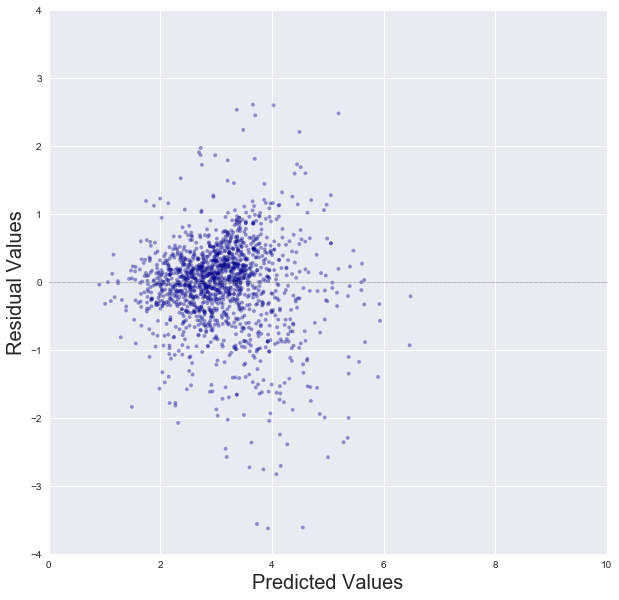

In [15]:

% matplotlib inline

f, ax = plt.subplots(1, figsize=(10, 10))
#plt.title("Residuals vs Predicted Values for OLS model", size = 20,alpha=1)

ax = plt.scatter(y = rentals2.residuals_rent_sqft, x = rentals2.pred_rent_sqft,alpha=0.4,s=15,
                 edgecolors='none',color='darkblue')
plt.xlabel("Predicted Values",size = 20)
plt.ylabel("Residual Values",size = 20)


x1 = np.linspace(0, 10, 1000)
y1 = np.zeros(len(x1))
plt.scatter(x1,y1,alpha=0.2,color='gray',s=1 )

plt.xlim(0, 10)
plt.ylim(-4,4)
plt.savefig('figures/residuals_prediction_OLS_sample.png', format='png', dpi=300)
plt.show()

# Generate maps to evaluate model

In [16]:
from pyproj import Proj, transform

# WGS 84
inProj = Proj(init='epsg:4326')

# Web mercator 
outProj = Proj(init='epsg:3857')

rentals['X'],rentals['Y'] = transform(inProj,outProj,rentals['longitude'].values,rentals['latitude'].values)

## Map observed, predicted and residual values using Datashader

In [17]:
from bokeh.io import output_notebook, show
from bokeh.plotting import Figure
from datashader.bokeh_ext import create_ramp_legend, create_categorical_legend

output_notebook()


Loading BokehJS ...

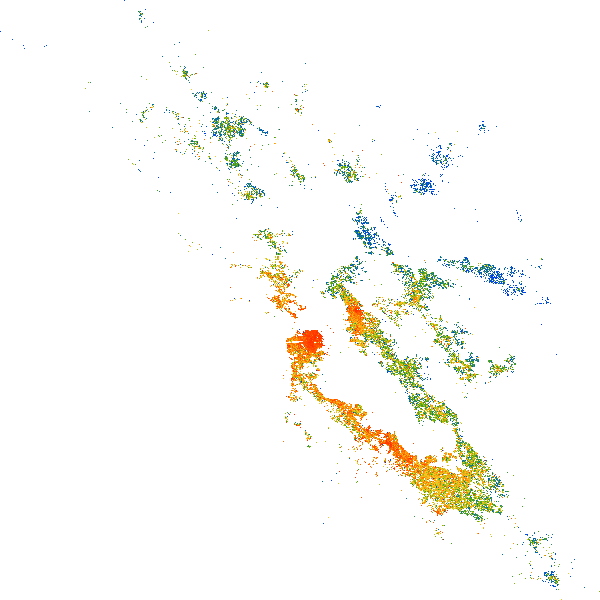

In [18]:
import datashader.transfer_functions as tf
#from colorcet import gray
from colorcet import rainbow
cvs = ds.Canvas(plot_width=600, plot_height=600)
agg = cvs.points(rentals, 'X', 'Y', ds.mean('rent_sqft'))
img= tf.set_background(tf.shade(agg, cmap=rainbow),"white")
img

In [19]:
legend_fig = create_ramp_legend(agg,
                                rainbow,
                                width=1000)
show(legend_fig)


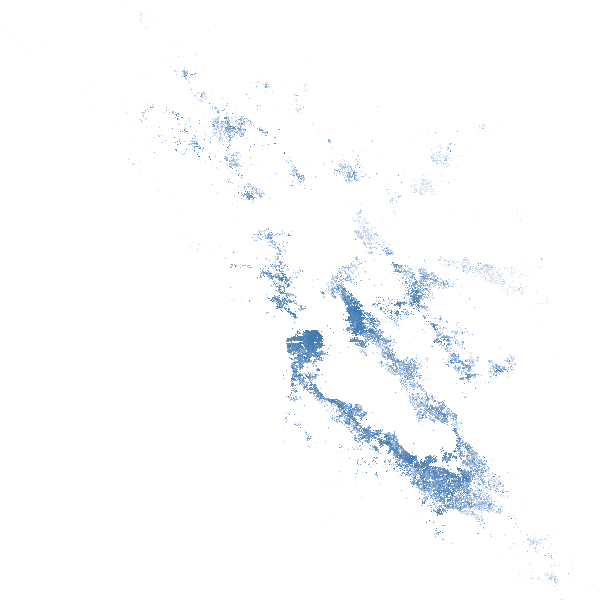

In [20]:
import datashader.transfer_functions as tf
from colorcet import blues
cvs = ds.Canvas(plot_width=600, plot_height=600)
agg = cvs.points(rentals, 'X', 'Y', ds.mean('pred_rent_sqft'))
img= tf.set_background(tf.shade(agg, cmap=blues),"white")
img

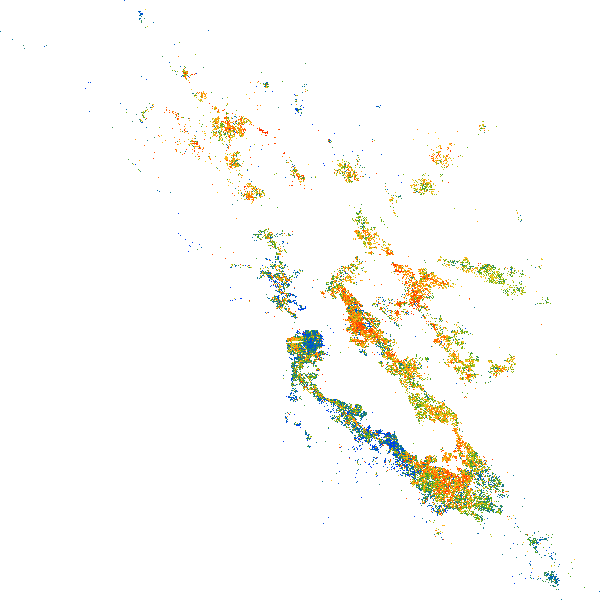

In [21]:
import datashader.transfer_functions as tf
from colorcet import rainbow
cvs = ds.Canvas(plot_width=600, plot_height=600)
agg = cvs.points(rentals, 'X', 'Y', ds.mean('residuals_rent_sqft'))
img= tf.set_background(tf.shade(agg, cmap=rainbow),"white")
img

## Map observed, predicted and residuals using Datashader with interactive maps

In [22]:
import holoviews.operation.datashader as hd
from datashader.colors import viridis

hd.shade.cmap = fire
hv.extension('bokeh', width=95)
viridis_r = list(reversed(viridis))[:-2]


url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'
#url="http://tile.stamen.com/toner-background/{Z}/{X}/{Y}.png"

tile_opts  = dict(width=600,height=600,xaxis=None,yaxis=None,bgcolor='white',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.5), plot=tile_opts)

points     = hv.Scatter(rentals, ['X','Y'],['rent_sqft'])

nodes = hd.datashade(points,  aggregator=ds.mean('rent_sqft'),
                               width=1000, height=600)

map_tiles * nodes

NameError: name 'fire' is not defined

In [23]:
import holoviews.operation.datashader as hd
from datashader.colors import viridis

hd.shade.cmap = fire
hv.extension('bokeh', width=95)
viridis_r = list(reversed(viridis))[:-2]


url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'
#url="http://tile.stamen.com/toner-background/{Z}/{X}/{Y}.png"

tile_opts  = dict(width=600,height=600,xaxis=None,yaxis=None,bgcolor='white',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.5), plot=tile_opts)

agg = cvs.points(rentals, 'X', 'Y', ds.mean('residuals_rent_sqft'))

nodes = hd.datashade(points,  aggregator=ds.mean('pred_rent_sqft'),
                               width=1000, height=600)

map_tiles * nodes

NameError: name 'fire' is not defined

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
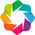

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [X,Y]   (R,G,B,A)

In [48]:



import holoviews.operation.datashader as hd
#hd.shade.cmap=[ '#247BA0','#70C1B3','#B2DBBF','#F3FFBD','#FF1654']
hv.extension('bokeh', width = 100)
hd.shade.cmap=[ '#0E46A0','#A4C4C3','#FF1654']


#url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'
#url="http://tile.stamen.com/toner-background/{Z}/{X}/{Y}.png"
url="http://tile.openstreetmap.com/{Z}/{X}/{Y}.png"

tile_opts  = dict(width=800,height=800,xaxis=None,yaxis=None,bgcolor='white',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.2), plot=tile_opts)

points   = hv.Scatter(rentals, ['X', 'Y'], ['residuals_rent_sqft'])

nodes = hd.datashade(points,  aggregator=ds.mean('residuals_rent_sqft'),
                               width=1000, height=600)

map_tiles * nodes




<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
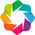

:DynamicMap   []
   :Overlay
      .WMTS.I :WMTS   [Longitude,Latitude]
      .RGB.I  :RGB   [X,Y]   (R,G,B,A)

In [25]:

import holoviews.operation.datashader as hd
hd.shade.cmap=rainbow
hv.extension('bokeh', width = 100)


#url = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{Z}/{Y}/{X}.jpg'
#url="http://tile.stamen.com/toner-background/{Z}/{X}/{Y}.png"
url="http://tile.openstreetmap.com/{Z}/{X}/{Y}.png"

tile_opts  = dict(width=800,height=800,xaxis=None,yaxis=None,bgcolor='white',show_grid=False)
map_tiles  = gv.WMTS(url).opts(style=dict(alpha=0.2), plot=tile_opts)

points   = hv.Scatter(rentals, ['X', 'Y'], ['residuals_rent_sqft'])

nodes = hd.datashade(points,  aggregator=ds.mean('residuals_rent_sqft'),
                               width=1000, height=600)

map_tiles * nodes





## Split the data into training and testing datasets for cross-validation

In [26]:
rentals = orca.get_table('rentals').to_frame()

In [27]:
rentals.shape

(363055, 21)

In [28]:
np.random.seed(12345)
rentals['randvar'] =  np.random.uniform(0,1,len(rentals))
rentals_train = rentals[rentals['randvar'] < .66667]
rentals_test = rentals[rentals['randvar'] >= .66667]

In [29]:
rentals_train.shape

(242159, 22)

In [30]:
rentals_test.shape

(120896, 22)

In [31]:
rentals_test.pred_rent_sqft = 0.0
rentals_test.residuals_rent_sqft = 0.0

In [32]:
rentals_test.head()

,Unnamed: 0,date,region,neighborhood,rent,bedrooms,sqft,rent_sqft,longitude,latitude,...,state,bathrooms,node_id_small,node_id_walk,pred_rent_sqft,res_sqft_per_unit,residuals_rent_sqft,X,Y,randvar
pid,,,,,,,,,,,,,,,,,,,,,
5873885791,0,11/13/2016 0:00,sacramento,,1717,2,943,1.820785,-121.962386,38.357364,...,CA,,62413119,62413119,0.0,943,0.0,-1.357679e+07,4.630033e+06,0.929616
5860387372,6,11/13/2016 0:00,sfbay,saratoga,3195,1,1650,1.936364,-122.019328,37.244180,...,CA,,290192646,65447734,0.0,1650,0.0,-1.358313e+07,4.473197e+06,0.964515
5873904666,8,11/13/2016 0:00,sfbay,laurel hts / presidio,8382,3,1700,4.930588,-122.465000,37.800500,...,CA,,3722724713,3722628508,0.0,1700,0.0,-1.363274e+07,4.551281e+06,0.748907
5862778795,10,11/13/2016 0:00,sfbay,sunnyvale,2500,1,714,3.501401,-122.016115,37.402136,...,CA,,65465292,1122964435,0.0,714,0.0,-1.358277e+07,4.495309e+06,0.747715
5848032495,11,11/13/2016 0:00,sfbay,fremont / union city / newark,2550,2,1400,1.821429,-121.977875,37.567032,...,CA,,1667624551,52988104,0.0,1400,0.0,-1.357851e+07,4.518441e+06,0.961307


In [33]:
orca.add_table('rentals_train', rentals_train)
orca.add_table('rentals_test', rentals_test)

In [34]:
orca.broadcast('nodeswalk', 'rentals_train', cast_index=True, onto_on='node_id_walk')
orca.broadcast('nodeswalk', 'rentals_test', cast_index=True, onto_on='node_id_walk')
orca.broadcast('nodessmall', 'rentals_train', cast_index=True, onto_on='node_id_small')
orca.broadcast('nodessmall', 'rentals_test', cast_index=True, onto_on='node_id_small')


In [35]:
m = OLSRegressionStep()
m.tables = ['rentals_train', 'nodessmall', 'nodeswalk']
m.filters = ['rent_sqft < 10']
m.model_expression = 'np.log1p(rent_sqft) ~ + np.log(res_sqft_per_unit) + \
    np.log(units_500_walk+1) + np.log(sqft_unit_500_walk+2)  + \
    np.log(rich_500_walk + 1) + np.log(singles_500_walk + 1) + np.log(elderly_hh_500_walk + 1) + \
    np.log(children_500_walk + 1) + \
    np.log(jobs_500_walk + 1) + np.log(jobs_1500_walk+1) + np.log(jobs_10000+1) + np.log(jobs_25000 + 1) + \
    np.log(pop_10000+1) + np.log(pop_black_10000+1) + np.log(pop_hisp_10000+1) + \
    np.log(pop_asian_10000+1)  '
m.out_column = 'pred_rent_sqft'
m.out_transform = np.expm1
m.name = 'hedonic_rent_sqft'
m.tags = ['paul', 'version 1']

m.fit()

                             OLS Regression Results                            
Dep. Variable:     np.log1p(rent_sqft)   R-squared:                       0.630
Model:                             OLS   Adj. R-squared:                  0.630
Method:                  Least Squares   F-statistic:                 2.745e+04
Date:                 Wed, 01 Aug 2018   Prob (F-statistic):               0.00
Time:                         10:23:30   Log-Likelihood:             1.1327e+05
No. Observations:               242063   AIC:                        -2.265e+05
Df Residuals:                   242047   BIC:                        -2.263e+05
Df Model:                           15                                         
Covariance Type:             nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------


In [36]:
m.register()

Saving 'hedonic_rent_sqft.yaml': /Users/arezoobzadeh/Documents/GitHub/urbansim_parcel_bayarea/configs
Loading model step 'hedonic_rent_sqft'


In [37]:
mrent = mm.get_step('hedonic_rent_sqft')
mrent.tables = ['rentals_test', 'nodessmall', 'nodeswalk']
mrent.out_column = 'pred_rent_sqft'

In [38]:
mrent.run()
rentals_test.head()

,Unnamed: 0,date,region,neighborhood,rent,bedrooms,sqft,rent_sqft,longitude,latitude,...,state,bathrooms,node_id_small,node_id_walk,pred_rent_sqft,res_sqft_per_unit,residuals_rent_sqft,X,Y,randvar
pid,,,,,,,,,,,,,,,,,,,,,
5873885791,0,11/13/2016 0:00,sacramento,,1717,2,943,1.820785,-121.962386,38.357364,...,CA,,62413119,62413119,1.951780,943,0.0,-1.357679e+07,4.630033e+06,0.929616
5860387372,6,11/13/2016 0:00,sfbay,saratoga,3195,1,1650,1.936364,-122.019328,37.244180,...,CA,,290192646,65447734,2.347378,1650,0.0,-1.358313e+07,4.473197e+06,0.964515
5873904666,8,11/13/2016 0:00,sfbay,laurel hts / presidio,8382,3,1700,4.930588,-122.465000,37.800500,...,CA,,3722724713,3722628508,2.476575,1700,0.0,-1.363274e+07,4.551281e+06,0.748907
5862778795,10,11/13/2016 0:00,sfbay,sunnyvale,2500,1,714,3.501401,-122.016115,37.402136,...,CA,,65465292,1122964435,4.000773,714,0.0,-1.358277e+07,4.495309e+06,0.747715
5848032495,11,11/13/2016 0:00,sfbay,fremont / union city / newark,2550,2,1400,1.821429,-121.977875,37.567032,...,CA,,1667624551,52988104,2.109230,1400,0.0,-1.357851e+07,4.518441e+06,0.961307


In [39]:
rentals_test.shape

(120896, 22)

In [40]:
rentals_test['residuals_rent_sqft'] = rentals_test['pred_rent_sqft'] - rentals_test['rent_sqft']
rentals_test.head()

,Unnamed: 0,date,region,neighborhood,rent,bedrooms,sqft,rent_sqft,longitude,latitude,...,state,bathrooms,node_id_small,node_id_walk,pred_rent_sqft,res_sqft_per_unit,residuals_rent_sqft,X,Y,randvar
pid,,,,,,,,,,,,,,,,,,,,,
5873885791,0,11/13/2016 0:00,sacramento,,1717,2,943,1.820785,-121.962386,38.357364,...,CA,,62413119,62413119,1.951780,943,0.130995,-1.357679e+07,4.630033e+06,0.929616
5860387372,6,11/13/2016 0:00,sfbay,saratoga,3195,1,1650,1.936364,-122.019328,37.244180,...,CA,,290192646,65447734,2.347378,1650,0.411014,-1.358313e+07,4.473197e+06,0.964515
5873904666,8,11/13/2016 0:00,sfbay,laurel hts / presidio,8382,3,1700,4.930588,-122.465000,37.800500,...,CA,,3722724713,3722628508,2.476575,1700,-2.454013,-1.363274e+07,4.551281e+06,0.748907
5862778795,10,11/13/2016 0:00,sfbay,sunnyvale,2500,1,714,3.501401,-122.016115,37.402136,...,CA,,65465292,1122964435,4.000773,714,0.499373,-1.358277e+07,4.495309e+06,0.747715
5848032495,11,11/13/2016 0:00,sfbay,fremont / union city / newark,2550,2,1400,1.821429,-121.977875,37.567032,...,CA,,1667624551,52988104,2.109230,1400,0.287802,-1.357851e+07,4.518441e+06,0.961307


In [41]:
rentals_test[['rent_sqft','pred_rent_sqft','residuals_rent_sqft']].describe()

,rent_sqft,pred_rent_sqft,residuals_rent_sqft
count,120896.000000,120896.000000,120896.000000
mean,3.179371,3.122210,-0.057161
std,1.093917,0.804043,0.667947
min,0.292398,0.356545,-7.766739
25%,2.495833,2.596774,-0.354309
50%,2.997500,3.085833,0.025957
75%,3.673469,3.595449,0.330788
max,13.072464,7.465113,3.061593


In [42]:
rentals_test['residuals_rent_sqft'].describe()

count    120896.000000
mean         -0.057161
std           0.667947
min          -7.766739
25%          -0.354309
50%           0.025957
75%           0.330788
max           3.061593
Name: residuals_rent_sqft, dtype: float64

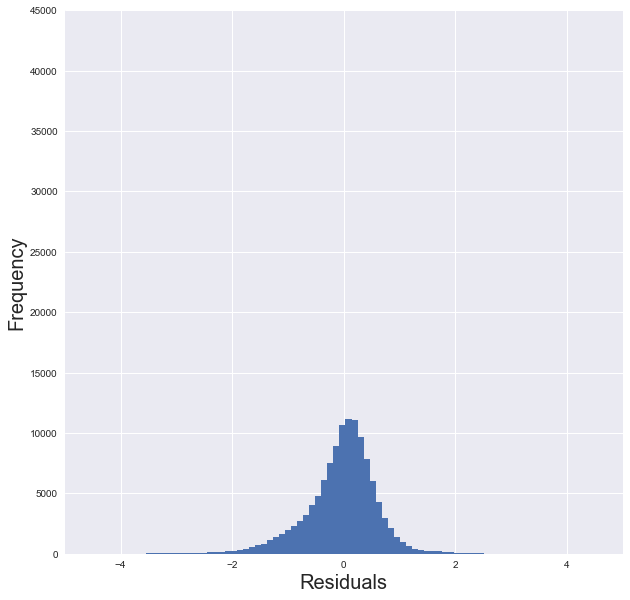

In [43]:

f, ax = plt.subplots(1, figsize=(10, 10))
#plt.title("Predicted vs Observed Rent per Sqft", size = 20,alpha=1)

rentals_test['residuals_rent_sqft'].plot(kind= 'hist',bins=100,)
plt.xlabel("Residuals",size = 20)
plt.ylabel("Frequency",size = 20)



ax.set(xlim=(-5, 5), ylim=(0, 45000))

ax.grid(True)

plt.savefig('figures/residuals_dist_ols.png', format='png', dpi=100)
plt.show()


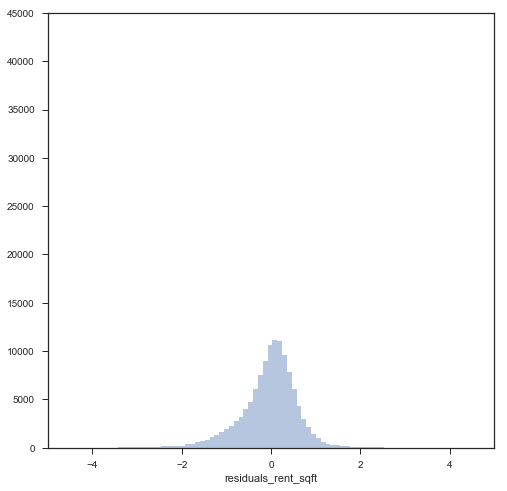

In [44]:
from scipy.stats import norm
plt.rcParams['figure.figsize']=8,8
sns.set_style("white")
sns.set_style("ticks")
#ax = sns.distplot(rentals_test.residuals_rent_sqft, bins=100, kde=False).set(xlim=(-5,5))


ax = sns.distplot(rentals_test.residuals_rent_sqft, bins=100, norm_hist=False,kde=False).set(xlim=(-5,5),ylim=(0,45000))


In [ ]:
%matplotlib inline
plt.figure(figsize=(8,8))

ax = sns.regplot(y = rentals_test.pred_rent_sqft, x = rentals_test.rent_sqft, \
                 scatter_kws={"color":"darkred","alpha":0.3,"s":1}\
               ).set(xlim=(0,10), ylim=(0,10))

In [50]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from math import sqrt
# The mean squared error
meanSquaredError = mean_squared_error(rentals_test.rent_sqft, rentals_test.pred_rent_sqft)
print('Mean squared error = %.4f' %meanSquaredError)

# rmse
rootMeanSquaredError = sqrt(meanSquaredError)
print('RMSE = %.4f' %rootMeanSquaredError)

# Explained variance score: 1 is perfect prediction
print('R2_score = %.4f' % r2_score(rentals_test.rent_sqft, rentals_test.pred_rent_sqft))

Mean squared error = 0.4494
RMSE = 0.6704
R2_score = 0.6244


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from math import sqrt
# The mean squared error
meanSquaredError = mean_squared_error(rentals_train.rent_sqft, rentals_test.pred_rent_sqft)
print('Mean squared error = %.4f' %meanSquaredError)

# rmse
rootMeanSquaredError = sqrt(meanSquaredError)
print('RMSE = %.4f' %rootMeanSquaredError)

# Explained variance score: 1 is perfect prediction
print('R2_score = %.4f' % r2_score(rentals_train.rent_sqft, rentals_test.pred_rent_sqft))